# Setup

## Python Environment

In [1]:
import os
import copy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ipywidgets as widgets
import xarray as xr
print('All packages imported.')

default_site = 'sgp-C1'
seed = 42 # for reproducibility
print(f'Random seed set as {seed}.')

All packages imported.
Random seed set as 42.


In [2]:
# Set threshold of rainy events
prec_threshold = 0.1
print(f'Threshold of rainy event is {prec_threshold} mm/hr')

Threshold of rainy event is 0.1 mm/hr


In [3]:
# Forced library reload
%reload_ext autoreload
%autoreload 2
# %aimport utils

## Site Selection

In [4]:
site = widgets.Select(
    options=['sgp-C1', 'twp-C1', 'twp-C2', 'twp-C3'],
    value=default_site,
    rows=6,
    description='ARM Site:',
    disabled=False
)


def on_change(change):
    if change['type'] == 'change' and change['name'] == 'value':
        print(f"Switch site to {change['new']}")


site.layout.width = '175px'
site.observe(on_change)
display(site)

Select(description='ARM Site:', layout=Layout(width='175px'), options=('sgp-C1', 'twp-C1', 'twp-C2', 'twp-C3')…

In [5]:
product = widgets.Select(
    options=['armbeatm'],
    value='armbeatm',
    rows=1,
    description='Product:',
    disabled=False
)

def on_change(change):
    if change['type'] == 'change' and change['name'] == 'value':
        print(f"Switch site to {change['new']}")
              
product.layout.width = '175px'
product.observe(on_change)
display(product)

Select(description='Product:', layout=Layout(width='175px'), options=('armbeatm',), rows=1, value='armbeatm')

## Data Import

In [6]:
def site2stream(site, product):
    region, index = site.split('-')
    stream = region+product+index
    #print(f'Ready for data stream: {stream}')
    return stream


def get_save_file_path(file_name, stage=2):
    CURRENT_DIR = os.getcwd()
    DATA_DIR = f'{CURRENT_DIR}/../../data/stage-{stage}_cleaned'
    FILE_PATH = f'{DATA_DIR}/{file_name}'
    return FILE_PATH


def get_DS(mf):
    return xr.open_mfdataset(mf)

In [7]:
stream = site2stream(site=site.value, product=product.value)
file_name = f'{stream}_standard_dropped.cdf'
FILE_PATH = get_save_file_path(file_name)

DS = get_DS(FILE_PATH)
DS

<xarray.Dataset>
Dimensions:        (p: 37, time: 2309)
Coordinates:
  * time           (time) datetime64[ns] 1994-10-10T14:30:00 ... 2016-12-30T11:30:00
  * p              (p) float32 1000.0 975.0 950.0 925.0 ... 150.0 125.0 100.0
Data variables:
    prec_sfc_next  (time) float32 dask.array<shape=(2309,), chunksize=(2309,)>
    prec_sfc       (time) float32 dask.array<shape=(2309,), chunksize=(2309,)>
    T_sfc          (time) float32 dask.array<shape=(2309,), chunksize=(2309,)>
    rh_sfc         (time) float32 dask.array<shape=(2309,), chunksize=(2309,)>
    u_sfc          (time) float32 dask.array<shape=(2309,), chunksize=(2309,)>
    v_sfc          (time) float32 dask.array<shape=(2309,), chunksize=(2309,)>
    p_sfc          (time) float32 dask.array<shape=(2309,), chunksize=(2309,)>
    T_p            (time, p) float32 dask.array<shape=(2309, 37), chunksize=(2309, 37)>
    rh_p           (time, p) float32 dask.array<shape=(2309, 37), chunksize=(2309, 37)>
    u_p            (tim

# Data Quality Control

## Data Visualization

### Instant Parameter Plots

In [8]:
from utils import plot_1d, plot_2d, binplot_prec

var_1d = [var for var in list(DS) if ('_sfc' in var)]
var_2d = [var for var in list(DS) if ('_p' in var)]
print(f'1-dim variables: {var_1d}')
print(f'2-dim variables: {var_2d}')

1-dim variables: ['prec_sfc_next', 'prec_sfc', 'T_sfc', 'rh_sfc', 'u_sfc', 'v_sfc', 'p_sfc']
2-dim variables: ['T_p', 'rh_p', 'u_p', 'v_p']


/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


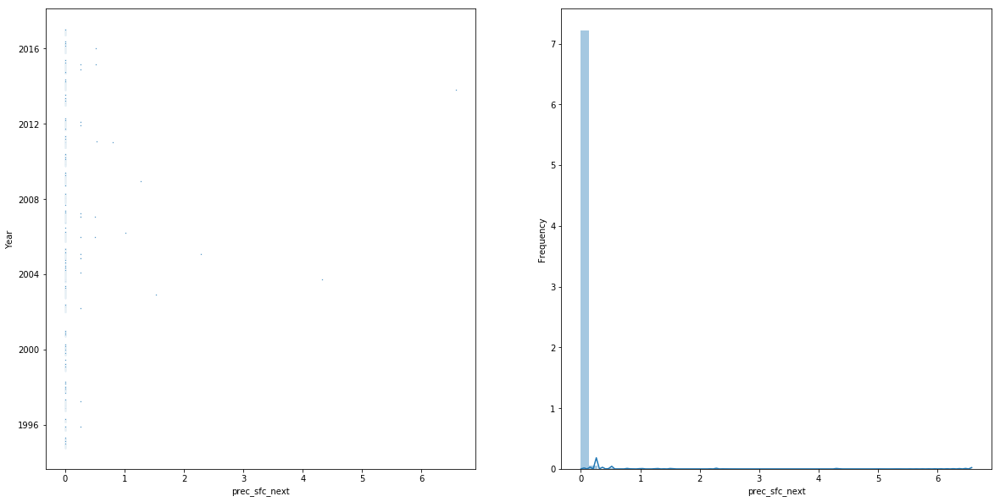

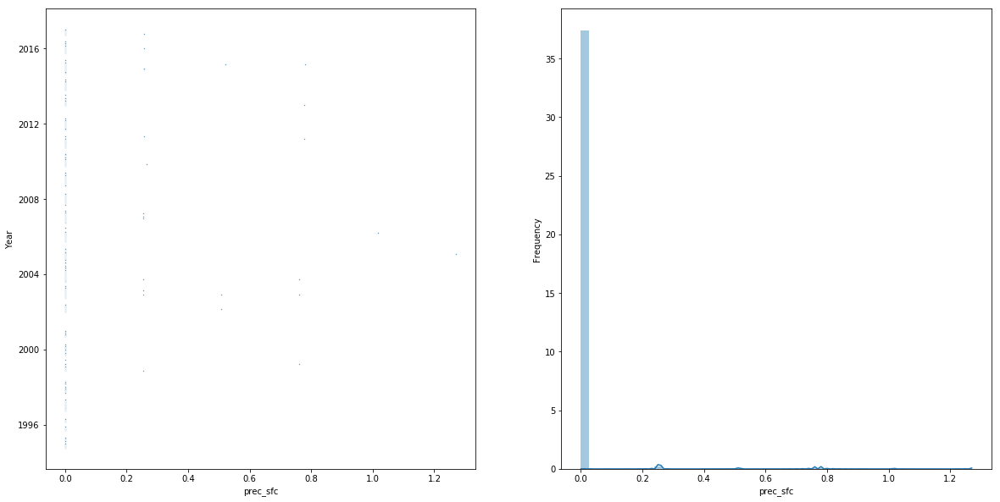

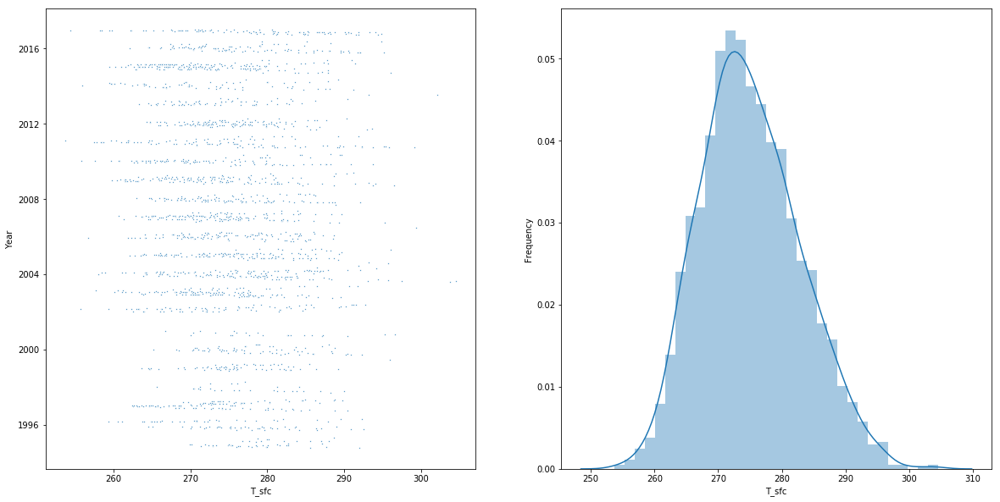

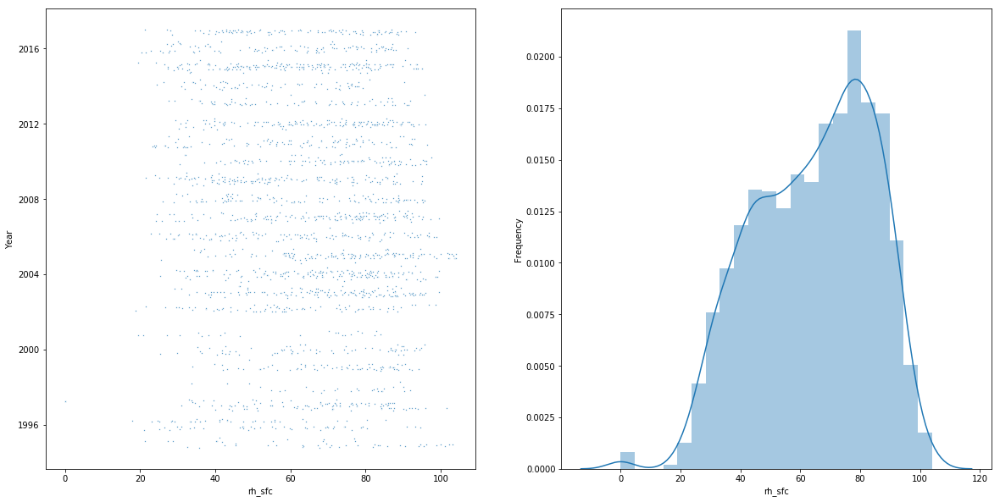

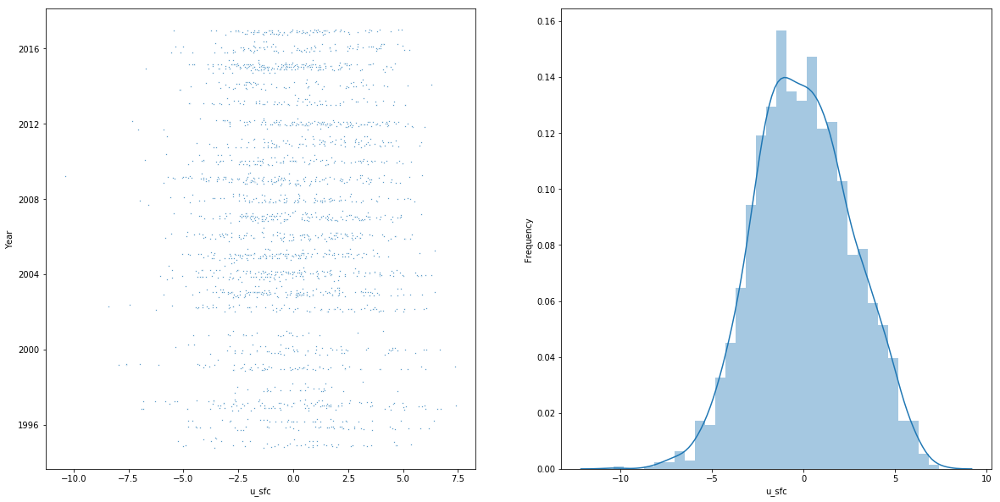

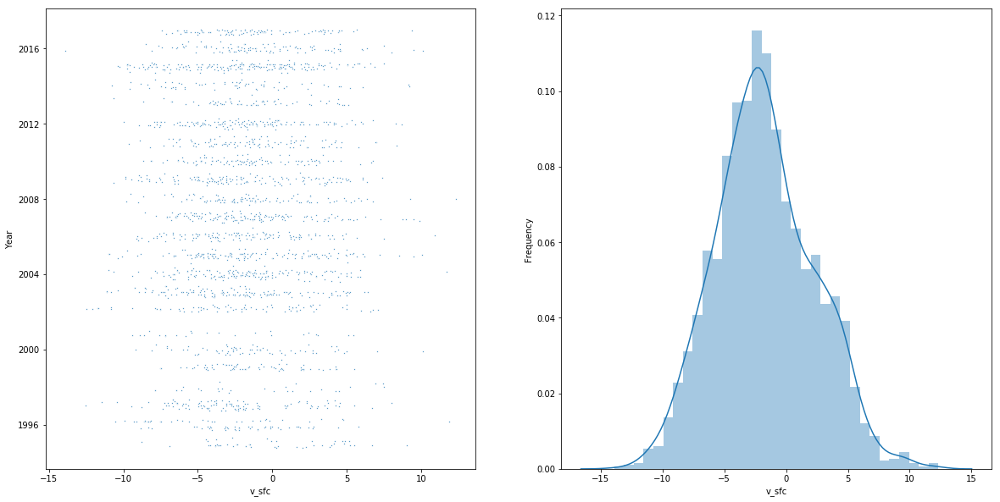

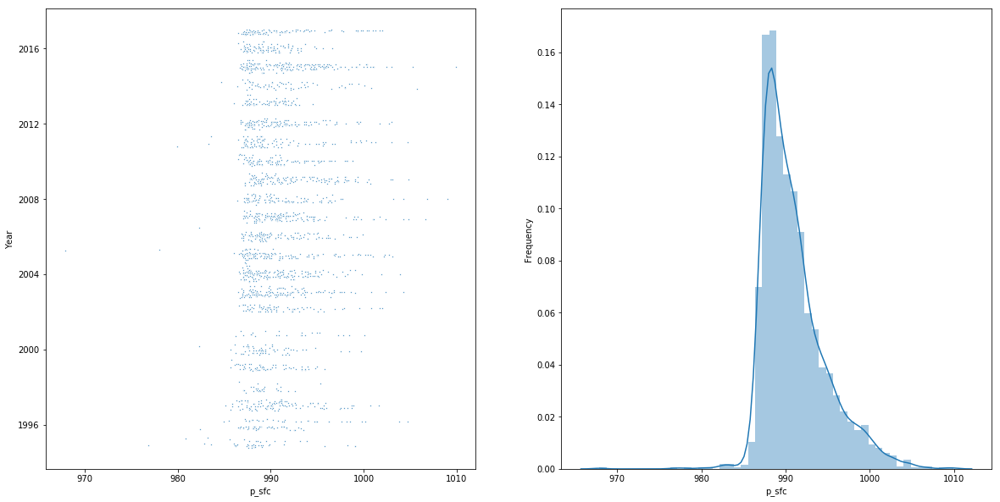

In [9]:
plot_1d(DS, var_1d)

In [13]:
(DS.prec_sfc.values > 0.1).count()


AttributeError: 'numpy.ndarray' object has no attribute 'count'

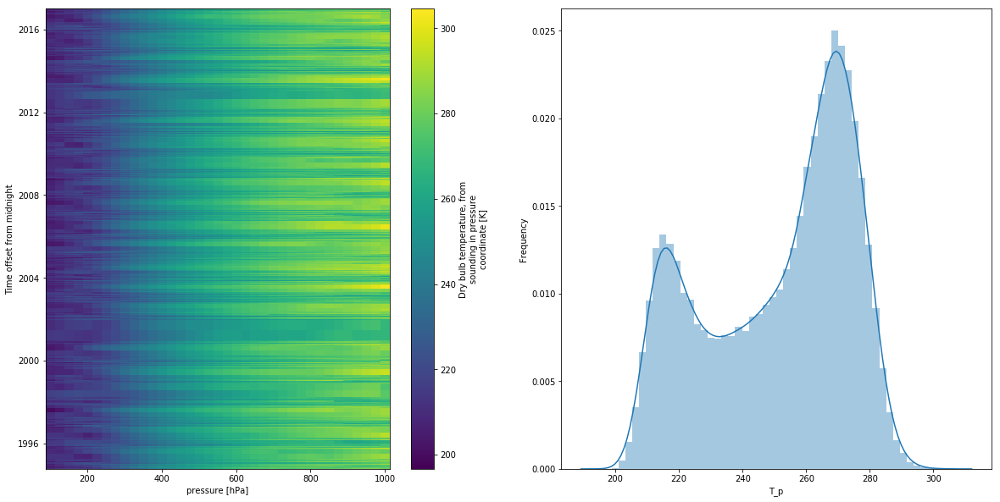

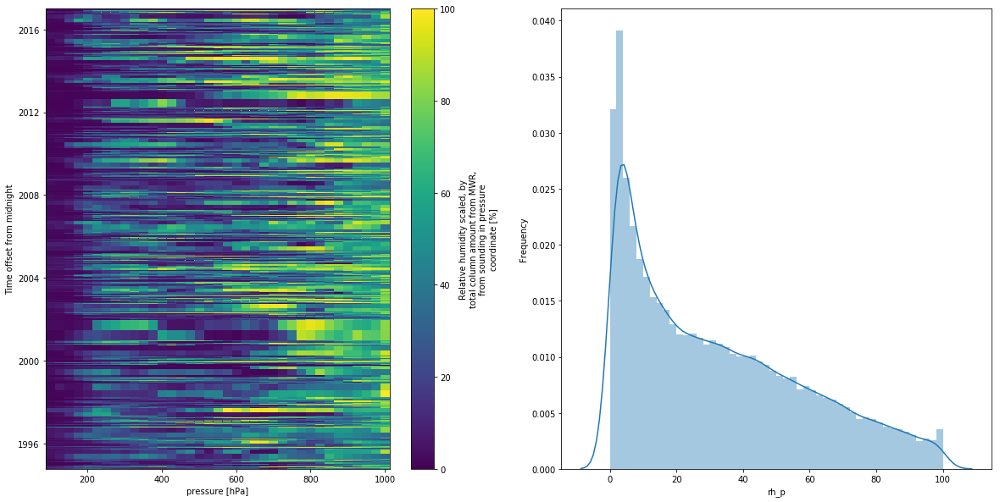

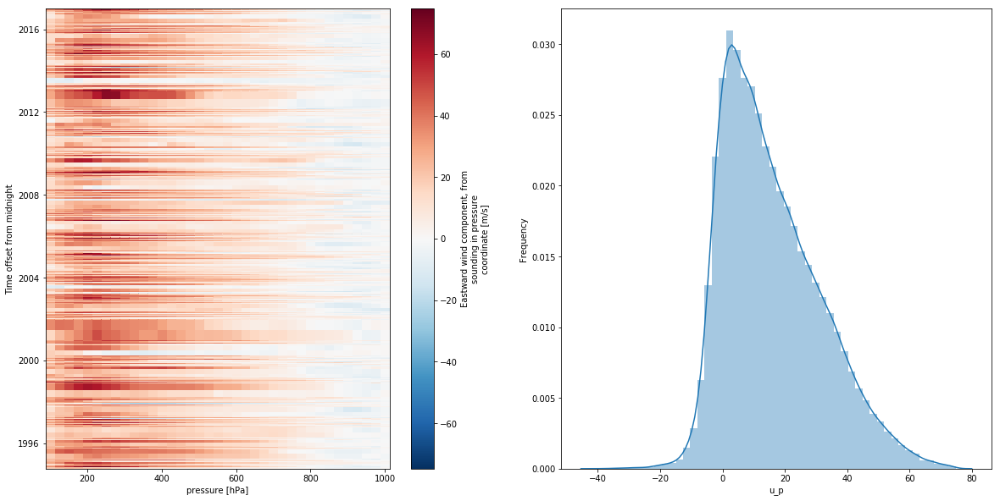

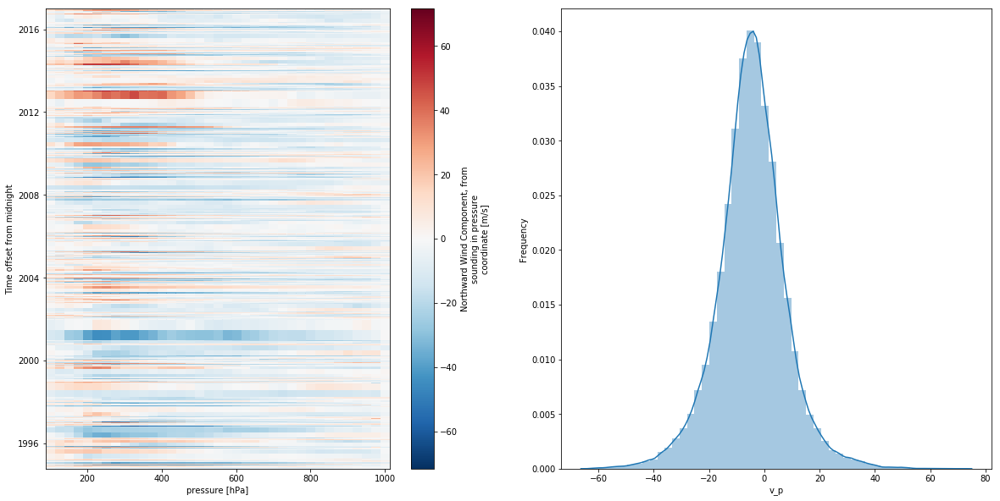

In [10]:
plot_2d(DS, var_2d)

### Correlation Plots

In [11]:
from utils import DS_flatten, plot_pair, plot_corr
DS_temp = DS_flatten(DS, var_1d, var_2d)
df = DS_temp.to_dataframe()

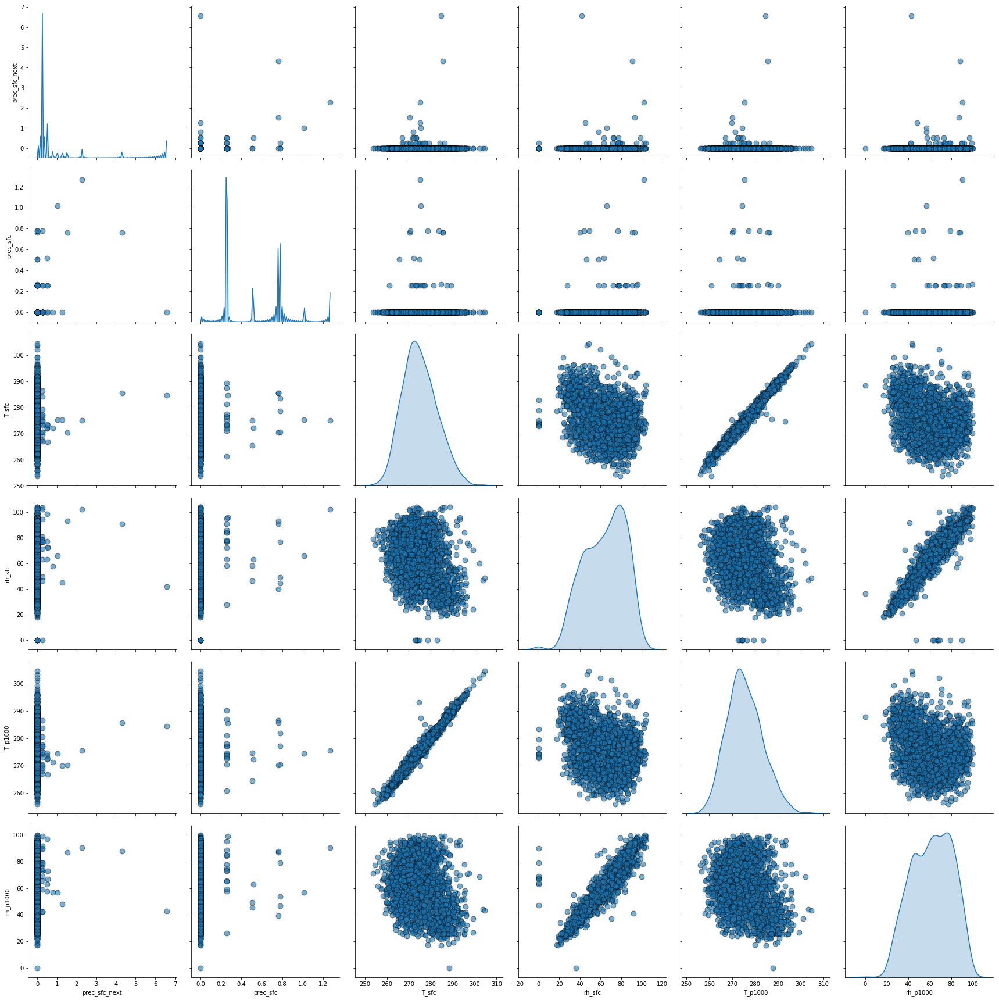

In [12]:
# Pair plot
plot_pair(df,
          cols_str=['prec_sfc_next', 'prec_sfc', 'T_sfc', 'rh_sfc', 'T_p1000', 'rh_p1000'])

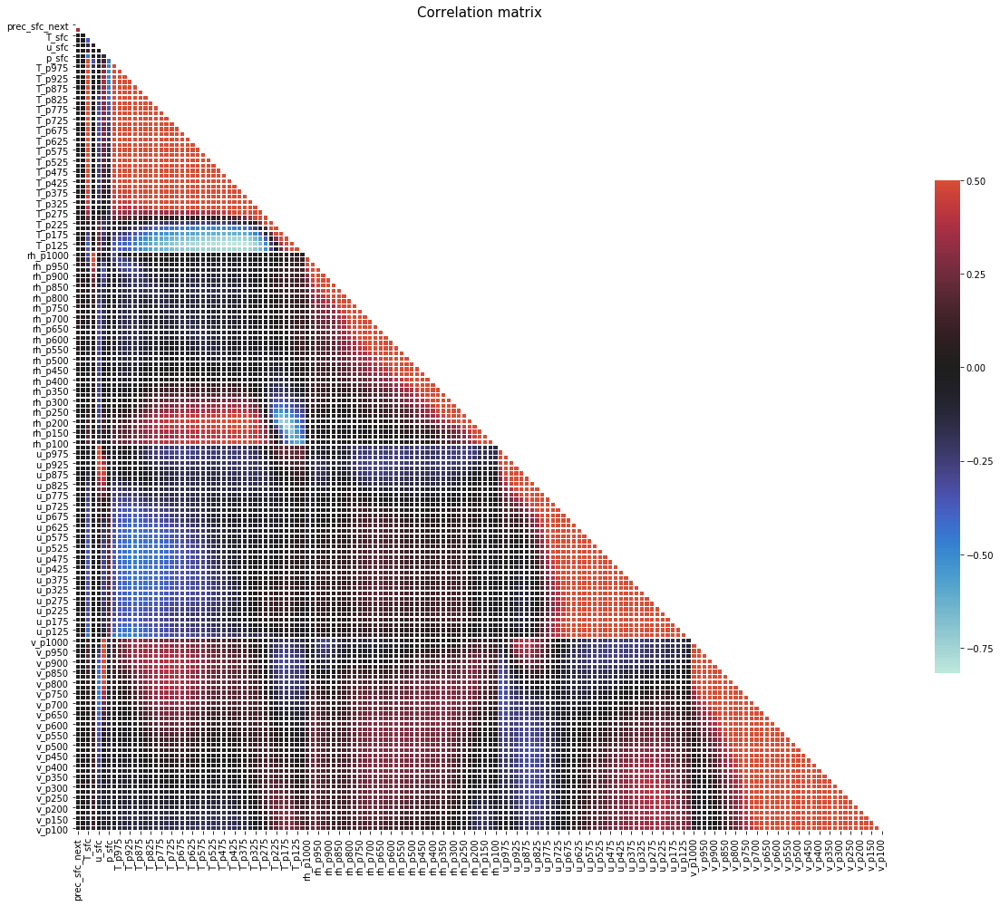

In [13]:
# Correlation Matrix
plot_corr(df)

### Flattened One-dimensional Parameter Plots

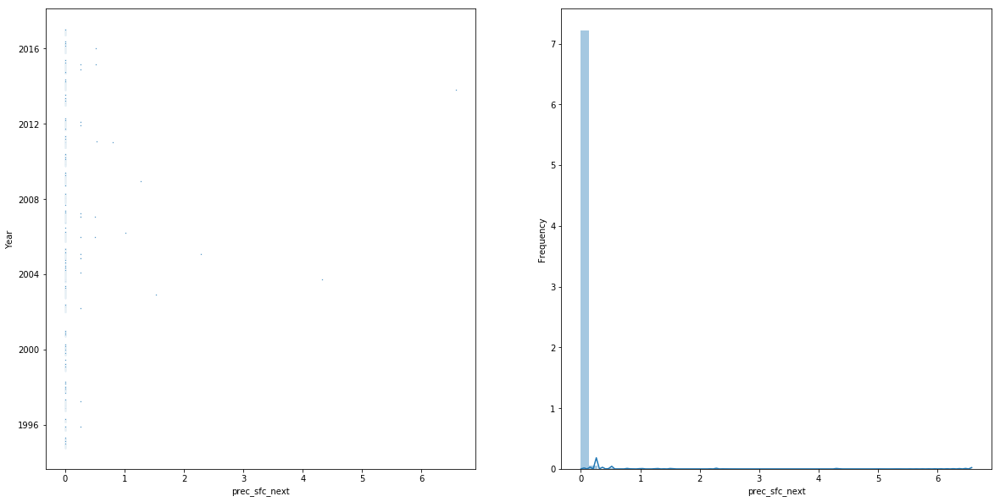

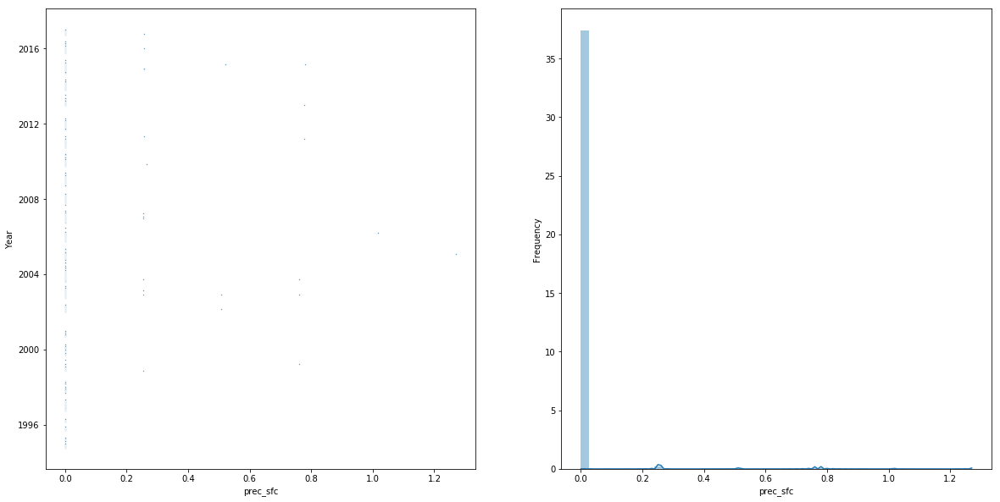

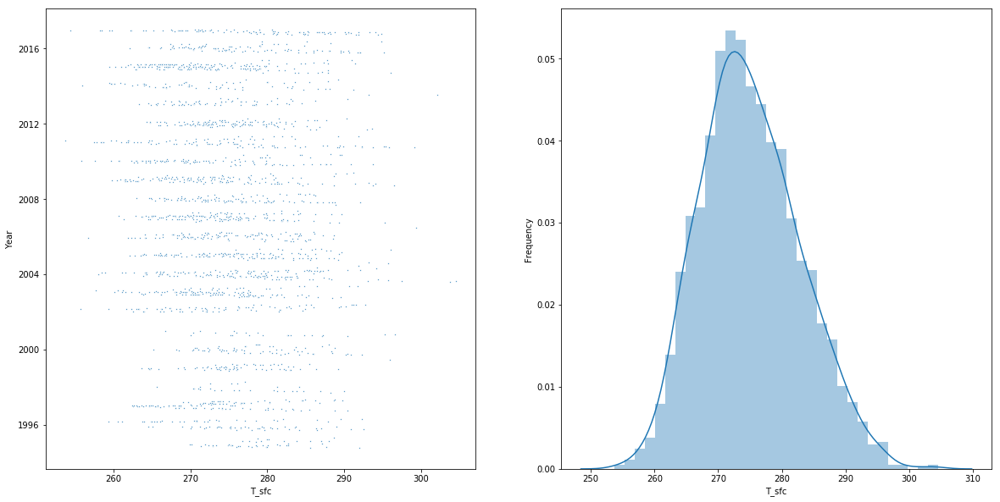

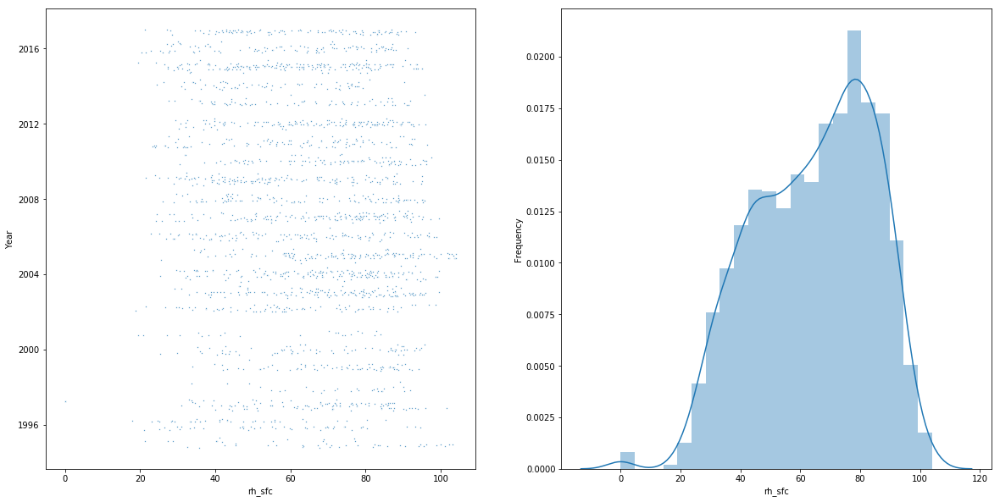

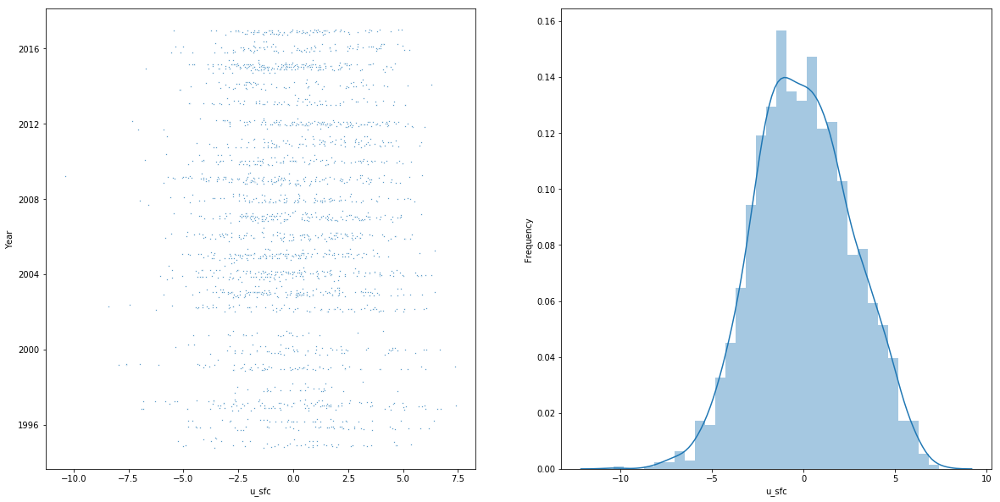

...

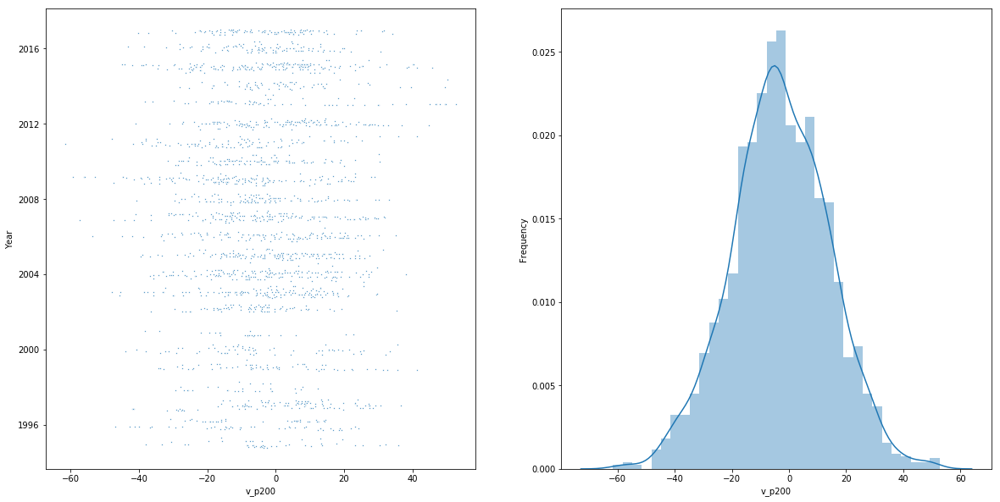

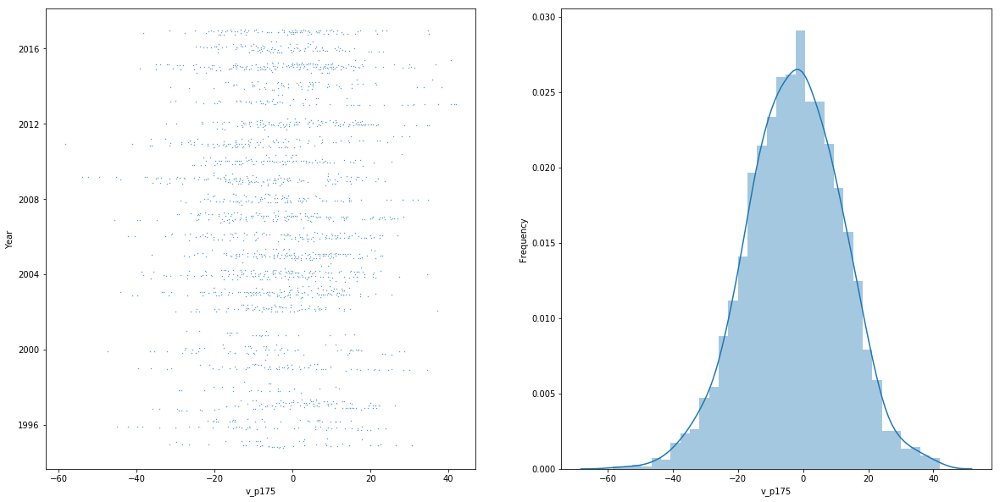

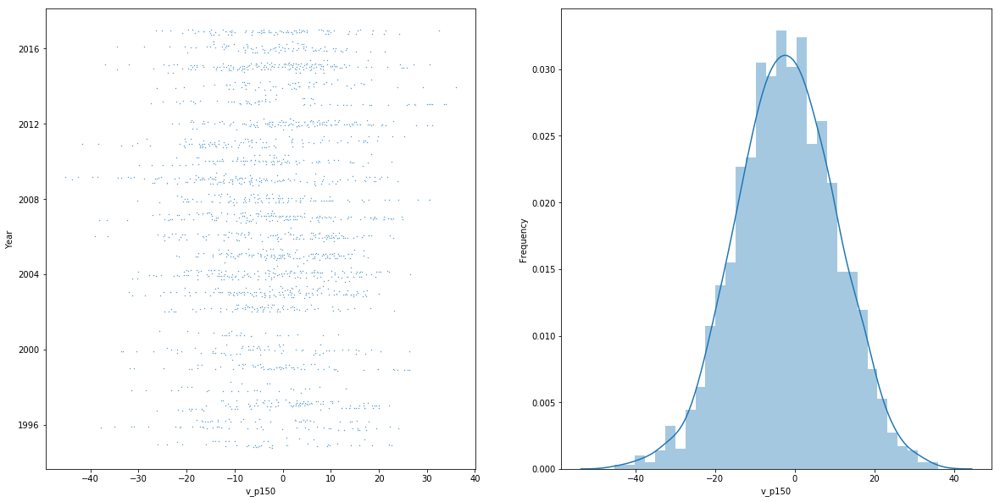

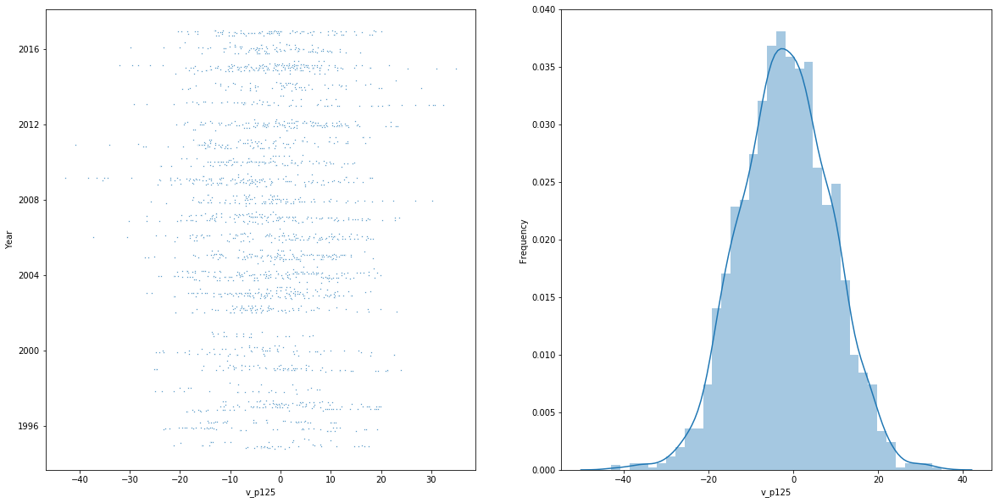

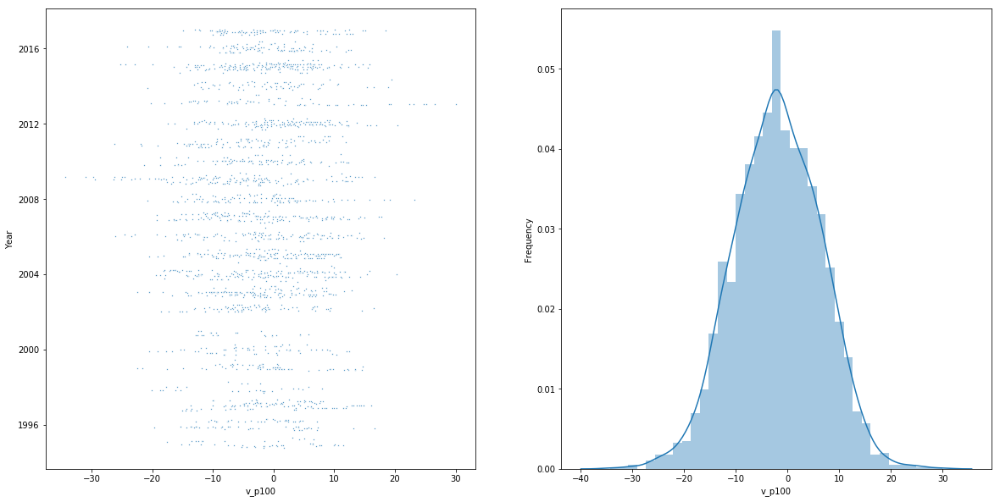

In [14]:
plot_1d(DS_temp, list(DS_temp))

## Data Filtering (DO NOT RUN TWICE)

In [15]:
from utils import abs_zscore_cut, abs_zscore, DS_mark_outliers, get_DS_plev

In [16]:
DS

<xarray.Dataset>
Dimensions:        (p: 37, time: 2309)
Coordinates:
  * time           (time) datetime64[ns] 1994-10-10T14:30:00 ... 2016-12-30T11:30:00
  * p              (p) float32 1000.0 975.0 950.0 925.0 ... 150.0 125.0 100.0
Data variables:
    prec_sfc_next  (time) float32 dask.array<shape=(2309,), chunksize=(2309,)>
    prec_sfc       (time) float32 dask.array<shape=(2309,), chunksize=(2309,)>
    T_sfc          (time) float32 dask.array<shape=(2309,), chunksize=(2309,)>
    rh_sfc         (time) float32 dask.array<shape=(2309,), chunksize=(2309,)>
    u_sfc          (time) float32 dask.array<shape=(2309,), chunksize=(2309,)>
    v_sfc          (time) float32 dask.array<shape=(2309,), chunksize=(2309,)>
    p_sfc          (time) float32 dask.array<shape=(2309,), chunksize=(2309,)>
    T_p            (time, p) float32 dask.array<shape=(2309, 37), chunksize=(2309, 37)>
    rh_p           (time, p) float32 dask.array<shape=(2309, 37), chunksize=(2309, 37)>
    u_p            (tim

# Data Pre-processing

## Data Loading

In [9]:
str_y = list(DS)[0]
str_Xscalar = [var for var in list(DS)[1:] if '_p' not in var]
str_Xvec = [var for var in list(DS)[1:] if '_p' in var]
#plev = DS['p'].values.astype(float)  # array of pressure level

from utils import extract_scalar, merge_channels

y, Xscalar = extract_scalar(DS, str_y, str_Xscalar)
Xvec = merge_channels(DS, str_Xvec)

print(y.shape)
print(Xscalar.shape)
print(Xvec.shape)

(2309, 1)
(2309, 6)
(2309, 37, 4)


## Train-test Split

In [10]:
# Check class imbalance
binary = y > prec_threshold
print('1 class ratio= {:.2%}'.format(binary.mean()))

1 class ratio= 1.17%


In [11]:
from classes import Sample, SampleSubset
from utils import split
all_sample = SampleSubset(binary, y, Xscalar, Xvec)

# train-test split
train_sample, temp_sample = split(all_sample, train_size=0.6)
validation_sample, test_sample = split(temp_sample, train_size=0.75)

s = Sample(train_sample, validation_sample, test_sample)
#train/valid/test is 0.6/0.3/0.1 split

/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2179: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2179: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [12]:
# class ratio
split_sizes = [s.train.size, s.validation.size, s.test.size]
split_sizes = [x/sum(split_sizes) for x in split_sizes]
print(f'train/valid/test is {split_sizes[0]:.2f}/{split_sizes[1]:.2f}/{split_sizes[2]:.2f} split')

# Class distribution in train and test samples
print('1 class ratio in train set= {:.2%}'.format(s.train.class_ratio))
print('1 class ratio in validation set= {:.2%}'.format(s.validation.class_ratio))
print('1 class ratio in test set= {:.2%}'.format(s.test.class_ratio))

train/valid/test is 0.60/0.30/0.10 split
1 class ratio in train set= 1.16%
1 class ratio in validation set= 1.15%
1 class ratio in test set= 1.30%


## Data Saving (for multiple site analysis)

In [13]:
import pickle
with open(get_save_file_path(f'{stream}.obj.pickle'), 'wb') as handle:
     pickle.dump(s, handle)

## Data Standardization/Flattening

In [21]:
from utils import standardize_all, flattening_all
s = standardize_all(s)
s = flattening_all(s)

## Data Grouping

In [22]:
# for convenience
from utils import all_x, all_y

# for classification
all_data = (s.train.Xflatten, s.validation.Xflatten, np.squeeze(s.train.bin), np.squeeze(s.validation.bin))
#all_data = (train_Xflatten, valid_Xflatten, np.squeeze(train_bin), np.squeeze(valid_bin))

# Classical Classification

## Model Objectification

In [23]:
from classes import Classifier

## Common Classifiers

### K-nearest Neighbours

In [24]:
# WARNING - high-dim KNN is time-consuming
from utils_classifiers import KNN_grid_search
# KNN does not have class_weight implemented - make sense
knn = Classifier('KNN', KNN_grid_search(all_data))

KNN k=1: CV F1 macro= [0.5885] + [0.0859]
KNN k=2: CV F1 macro= [0.4971] + [0.0002]
KNN k=3: CV F1 macro= [0.5304] + [0.0669]
KNN k=4: CV F1 macro= [0.4971] + [0.0002]
KNN k=5: CV F1 macro= [0.4971] + [0.0002]
KNN k=6: CV F1 macro= [0.4971] + [0.0002]
KNN k=7: CV F1 macro= [0.4971] + [0.0002]
KNN k=8: CV F1 macro= [0.4971] + [0.0002]
KNN k=9: CV F1 macro= [0.4971] + [0.0002]
KNN k=10: CV F1 macro= [0.4971] + [0.0002]
              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       0.33      0.12      0.18         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.66      0.56      0.59       693
weighted avg       0.98      0.99      0.98       693

[[683   2]
 [  7   1]]
AUROC= 0.5610
F1 macro= 0.5876

KNN k=1: F1 macro= 0.5876


### Logistic Regression

In [25]:
from utils_classifiers import LogReg_grid_search
logreg = Classifier('Logistic Regression', LogReg_grid_search(all_data))

L2 LogReg β=0.1: CV F1 macro= [0.5345] + [0.0342]
L2 LogReg β=0.2: CV F1 macro= [0.5441] + [0.0380]
L2 LogReg β=0.3: CV F1 macro= [0.5542] + [0.0424]
L2 LogReg β=0.4: CV F1 macro= [0.5572] + [0.0440]
L2 LogReg β=0.5: CV F1 macro= [0.5607] + [0.0479]
L2 LogReg β=0.6: CV F1 macro= [0.5615] + [0.0479]
L2 LogReg β=0.7: CV F1 macro= [0.5655] + [0.0531]
L2 LogReg β=0.8: CV F1 macro= [0.5597] + [0.0544]
L2 LogReg β=0.9: CV F1 macro= [0.5607] + [0.0546]
L2 LogReg β=1.0: CV F1 macro= [0.5613] + [0.0544]
L2 LogReg β=2.0: CV F1 macro= [0.5668] + [0.0541]
L2 LogReg β=3.0: CV F1 macro= [0.5716] + [0.0563]
L2 LogReg β=4.0: CV F1 macro= [0.5772] + [0.0622]
L2 LogReg β=5.0: CV F1 macro= [0.5797] + [0.0636]
L2 LogReg β=6.0: CV F1 macro= [0.5634] + [0.0469]
L2 LogReg β=7.0: CV F1 macro= [0.5502] + [0.0539]
L2 LogReg β=8.0: CV F1 macro= [0.5497] + [0.0540]
L2 LogReg β=9.0: CV F1 macro= [0.5510] + [0.0553]
L2 LogReg β=10.0: CV F1 macro= [0.5509] + [0.0554]
L1 LogReg β=0.1: CV F1 macro= [0.5233] + [0.0270]

/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


### Support-vector Machine

In [26]:
from utils_classifiers import SVM_grid_search
svm = Classifier('SVM', SVM_grid_search(all_data))

SVM β=0.1: CV F1 macro= [0.6167] + [0.1081]
SVM β=0.2: CV F1 macro= [0.6240] + [0.0498]
SVM β=0.3: CV F1 macro= [0.6169] + [0.0151]
SVM β=0.4: CV F1 macro= [0.6243] + [0.0194]
SVM β=0.5: CV F1 macro= [0.6043] + [0.0560]
SVM β=0.6: CV F1 macro= [0.6043] + [0.0560]
SVM β=0.7: CV F1 macro= [0.5757] + [0.0661]
SVM β=0.8: CV F1 macro= [0.5757] + [0.0661]
SVM β=0.9: CV F1 macro= [0.5787] + [0.0676]
SVM β=1.0: CV F1 macro= [0.5787] + [0.0676]
SVM β=2.0: CV F1 macro= [0.5539] + [0.0702]
SVM β=3.0: CV F1 macro= [0.5589] + [0.0765]
SVM β=4.0: CV F1 macro= [0.5589] + [0.0765]
SVM β=5.0: CV F1 macro= [0.5589] + [0.0765]
SVM β=6.0: CV F1 macro= [0.5589] + [0.0765]
SVM β=7.0: CV F1 macro= [0.5589] + [0.0765]
SVM β=8.0: CV F1 macro= [0.5589] + [0.0765]
SVM β=9.0: CV F1 macro= [0.5589] + [0.0765]
SVM β=10.0: CV F1 macro= [0.5589] + [0.0765]
              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       0.67      0.25      0.36         8


## Tree-type Classifiers

### Random Forest

In [27]:
from utils_classifiers import RandomForest_grid_search
forest = Classifier('Random Forest', RandomForest_grid_search(all_data))

              precision    recall  f1-score   support

       False       0.99      0.99      0.99       685
        True       0.10      0.12      0.11         8

   micro avg       0.98      0.98      0.98       693
   macro avg       0.54      0.56      0.55       693
weighted avg       0.98      0.98      0.98       693

[[676   9]
 [  7   1]]
AUROC= 0.5559
F1 macro= 0.5497
RandomForest depth=2: F1 macro= [0.5497]
              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       0.33      0.12      0.18         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.66      0.56      0.59       693
weighted avg       0.98      0.99      0.98       693

[[683   2]
 [  7   1]]
AUROC= 0.5610
F1 macro= 0.5876
RandomForest depth=3: F1 macro= [0.5876]


/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and bein

              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       0.00      0.00      0.00         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.49      0.50      0.50       693
weighted avg       0.98      0.99      0.98       693

[[685   0]
 [  8   0]]
AUROC= 0.5000
F1 macro= 0.4971
RandomForest depth=4: F1 macro= [0.4971]


/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and bein

              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       0.00      0.00      0.00         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.49      0.50      0.50       693
weighted avg       0.98      0.99      0.98       693

[[685   0]
 [  8   0]]
AUROC= 0.5000
F1 macro= 0.4971
RandomForest depth=5: F1 macro= [0.4971]


/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and bein

              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       0.00      0.00      0.00         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.49      0.50      0.50       693
weighted avg       0.98      0.99      0.98       693

[[685   0]
 [  8   0]]
AUROC= 0.5000
F1 macro= 0.4971
RandomForest depth=6: F1 macro= [0.4971]


/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and bein

              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       0.00      0.00      0.00         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.49      0.50      0.50       693
weighted avg       0.98      0.99      0.98       693

[[685   0]
 [  8   0]]
AUROC= 0.5000
F1 macro= 0.4971
RandomForest depth=7: F1 macro= [0.4971]


/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and bein

              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       0.00      0.00      0.00         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.49      0.50      0.50       693
weighted avg       0.98      0.99      0.98       693

[[685   0]
 [  8   0]]
AUROC= 0.5000
F1 macro= 0.4971
RandomForest depth=8: F1 macro= [0.4971]


/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and bein

              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       0.00      0.00      0.00         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.49      0.50      0.50       693
weighted avg       0.98      0.99      0.98       693

[[685   0]
 [  8   0]]
AUROC= 0.5000
F1 macro= 0.4971
RandomForest depth=9: F1 macro= [0.4971]


/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and bein

              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       0.00      0.00      0.00         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.49      0.50      0.50       693
weighted avg       0.98      0.99      0.98       693

[[685   0]
 [  8   0]]
AUROC= 0.5000
F1 macro= 0.4971
RandomForest depth=10: F1 macro= [0.4971]
              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       0.33      0.12      0.18         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.66      0.56      0.59       693
weighted avg       0.98      0.99      0.98       693

[[683   2]
 [  7   1]]
AUROC= 0.5610
F1 macro= 0.5876

RandomForest depth=3: F1 macro= 0.5876


### Bagging

In [28]:
from utils_classifiers import Bagging
# Bagging does not have class_weight implemented
bag = Classifier('Bagging', Bagging(all_data))

              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       1.00      0.12      0.22         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.99      0.56      0.61       693
weighted avg       0.99      0.99      0.99       693

[[685   0]
 [  7   1]]
AUROC= 0.5625
F1 macro= 0.6086


### Decision Tree

In [29]:
from utils_classifiers import DecisionTree
tree = Classifier('Decision Tree', DecisionTree(all_data))

              precision    recall  f1-score   support

       False       0.99      0.99      0.99       685
        True       0.17      0.12      0.14         8

   micro avg       0.98      0.98      0.98       693
   macro avg       0.58      0.56      0.57       693
weighted avg       0.98      0.98      0.98       693

[[680   5]
 [  7   1]]
AUROC= 0.5589
F1 macro= 0.5671


### Extra Trees

In [30]:
from utils_classifiers import ExtraTrees
extra = Classifier('Extra Trees', ExtraTrees(all_data))

              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       0.00      0.00      0.00         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.49      0.50      0.50       693
weighted avg       0.98      0.99      0.98       693

[[685   0]
 [  8   0]]
AUROC= 0.5000
F1 macro= 0.4971


/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and bein

## Boosting Classifiers

### Gradient Boosting

In [31]:
from utils_classifiers import GradB
# GradB does not have class_weight implemented
gradb = Classifier('Gradient Boosting', GradB(all_data))

              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       0.25      0.12      0.17         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.62      0.56      0.58       693
weighted avg       0.98      0.99      0.98       693

[[682   3]
 [  7   1]]
AUROC= 0.5603
F1 macro= 0.5797


### AdaBoost

In [32]:
from utils_classifiers import AdaB
# AdaB does not have class_weight implemented
adab = Classifier('AdaBoost', AdaB(all_data))

              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       0.00      0.00      0.00         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.49      0.50      0.50       693
weighted avg       0.98      0.99      0.98       693

[[685   0]
 [  8   0]]
AUROC= 0.5000
F1 macro= 0.4971


/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and bein

### XGBoost

In [33]:
from utils_classifiers import XGB
# XGB does not have class_weight implemented
xgb = Classifier('XGBoost', XGB(all_data))

              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       0.00      0.00      0.00         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.49      0.50      0.50       693
weighted avg       0.98      0.99      0.98       693

[[685   0]
 [  8   0]]
AUROC= 0.5000
F1 macro= 0.4971


/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and bein

## Bayesian Classifiers

### Naïve Bayes

In [34]:
from utils_classifiers import NBayes
# NBayes does not have class_weight implemented
bayes = Classifier('Naïve Bayes', NBayes(all_data))

              precision    recall  f1-score   support

       False       0.99      0.83      0.90       685
        True       0.04      0.62      0.08         8

   micro avg       0.82      0.82      0.82       693
   macro avg       0.52      0.73      0.49       693
weighted avg       0.98      0.82      0.89       693

[[566 119]
 [  3   5]]
AUROC= 0.7256
F1 macro= 0.4892


### Gaussian Process

In [35]:
from utils_classifiers import GP
# GP does not have class_weight implemented
gp = Classifier('Gaussian Process', GP(all_data))

              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       0.33      0.12      0.18         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.66      0.56      0.59       693
weighted avg       0.98      0.99      0.98       693

[[683   2]
 [  7   1]]
AUROC= 0.5610
F1 macro= 0.5876


## Majority Voting

In [36]:
models = [knn, logreg, svm, forest, bag,
          tree, extra, gradb, adab, xgb, bayes, gp]
model_summary = pd.DataFrame({'Model': [x.name for x in models],
                              'F1': [x.f1_macro for x in models]}).set_index('Model').sort_values('F1',
                                                                                                  ascending=False)
model_summary

,F1
Model,
SVM,0.679273
Bagging,0.608569
KNN,0.587636
Random Forest,0.587636
Gaussian Process,0.587636
Gradient Boosting,0.579694
Decision Tree,0.567055
Logistic Regression,0.540659
Extra Trees,0.497097


In [37]:
from utils_classifiers import Voting
voting = Classifier('Voting', Voting(all_data, 
                                     models=[x.classifier for x in models],
                                     model_name=[x.name for x in models], 
                                     weights=[x.f1_macro for x in models],
                                     how_to_vote='hard'))

              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       1.00      0.12      0.22         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.99      0.56      0.61       693
weighted avg       0.99      0.99      0.99       693

[[685   0]
 [  7   1]]
AUROC= 0.5625
F1 macro= 0.6086


## Stacking

# Convolutional Neural Net

## ADASYN Oversampling

In [38]:
from classes import AugmentedSubset
aug = Sample(AugmentedSubset(s.train), s.validation, s.test)
print('1 class ratio after ADASYN= {:.2%}'.format(aug.train.class_ratio))

/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


1 class ratio after ADASYN= 49.91%


## Network Construction

In [39]:
from keras.models import Model
from keras.layers import Activation, BatchNormalization, Conv1D, Dense, Dropout, MaxPooling1D
from keras.layers import concatenate, Flatten, Input
from keras.optimizers import Adam
from keras.utils import plot_model
from keras import regularizers
from keras.callbacks import EarlyStopping, ModelCheckpoint

from utils_nn import f1_macro_loss

Using TensorFlow backend.


In [40]:
# Input placeholders
input_conv = Input(shape=aug.train.Xvec.shape[1:], name='column_input')
input_scalar = Input(shape=(aug.train.Xscalar.shape[1],), name='surface_input')

# Hidden layers
conv_1 = Conv1D(8, kernel_size=8)(input_conv)
bn_1 = BatchNormalization()(conv_1)
pool_1 = MaxPooling1D(pool_size=2)(bn_1)
act_1 = Activation('relu')(pool_1)

conv_2 = Conv1D(2, kernel_size=4)(act_1)
bn_2 = BatchNormalization()(conv_2)
pool_2 = MaxPooling1D(pool_size=2)(bn_2)
act_2 = Activation('relu')(pool_2)

flatten_2 = Flatten()(act_2)

layer = concatenate([flatten_2, input_scalar])
#layer = Dense(4, activation='relu')(layer)

hid_3 = Dense(4,
              activation='relu')(layer)
hid_3 = Dropout(0.1)(hid_3)

output = Dense(1,
               kernel_regularizer=regularizers.l2(0.02),
               activation='sigmoid',
               name='output')(hid_3)

# 1. Initialize
model = Model(inputs=[input_conv, input_scalar], outputs=output)
to_file_path = f'nn/model_c_{site.value}.png'
plot_model(model, show_shapes=True, to_file=to_file_path)
print(model.summary())

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
column_input (InputLayer)       (None, 37, 4)        0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 30, 8)        264         column_input[0][0]               
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 30, 8)        32          conv1d_1[0][0]                   
__________________________________________________________________________________________________
max_pooling1d_1 (MaxPooling1D)  (None, 15, 8)        0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
activation

## Network Training

In [41]:
# 2. Compile
model.compile(optimizer=Adam(),
              loss=f1_macro_loss)

to_file_path = f'nn/best_model_r_{site.value}.h5'
callbacks = [EarlyStopping(monitor='loss',
                           min_delta=0,
                           patience=20,
                           verbose=0, mode='auto'),
             ModelCheckpoint(filepath=to_file_path, 
                             monitor='loss', 
                             save_best_only=True)]

In [42]:
# 3. Train
model.fit([aug.train.Xvec, aug.train.Xscalar], aug.train.bin,
          epochs=2000,
          callbacks=callbacks,
          verbose=2,
          batch_size=32, 
          validation_data=([aug.validation.Xvec, aug.validation.Xscalar], aug.validation.bin)
         )

Train on 2733 samples, validate on 693 samples
Epoch 1/2000
 - 1s - loss: 0.4738 - val_loss: 0.6378
Epoch 2/2000
 - 1s - loss: 0.3954 - val_loss: 0.5680
Epoch 3/2000
 - 0s - loss: 0.3240 - val_loss: 0.5250
Epoch 4/2000
 - 1s - loss: 0.2559 - val_loss: 0.5003
Epoch 5/2000
 - 1s - loss: 0.1909 - val_loss: 0.4931
Epoch 6/2000
 - 1s - loss: 0.1402 - val_loss: 0.4930
Epoch 7/2000
 - 0s - loss: 0.1052 - val_loss: 0.4947
Epoch 8/2000
 - 0s - loss: 0.0851 - val_loss: 0.4897
Epoch 9/2000
 - 0s - loss: 0.0701 - val_loss: 0.4901
Epoch 10/2000
 - 0s - loss: 0.0647 - val_loss: 0.4902
Epoch 11/2000
 - 0s - loss: 0.0627 - val_loss: 0.4937
Epoch 12/2000
 - 1s - loss: 0.0563 - val_loss: 0.4970
Epoch 13/2000
 - 1s - loss: 0.0507 - val_loss: 0.4970
Epoch 14/2000
 - 1s - loss: 0.0508 - val_loss: 0.4850
Epoch 15/2000
 - 1s - loss: 0.0457 - val_loss: 0.4896
Epoch 16/2000
 - 0s - loss: 0.0420 - val_loss: 0.4883
Epoch 17/2000
 - 1s - loss: 0.0413 - val_loss: 0.4837
Epoch 18/2000
 - 1s - loss: 0.0387 - val_los

## Testing

In [43]:
from utils_classifiers import reports

aug.validation.bin_hat = model.predict([aug.validation.Xvec, aug.validation.Xscalar]) >= 0.5
_ = (reports(aug.validation.bin, aug.validation.bin_hat))

              precision    recall  f1-score   support

       False       0.99      1.00      0.99       685
        True       0.00      0.00      0.00         8

   micro avg       0.99      0.99      0.99       693
   macro avg       0.49      0.50      0.50       693
weighted avg       0.98      0.99      0.98       693

[[684   1]
 [  8   0]]
AUROC= 0.4993
F1 macro= 0.4967


# Classifier Selection

## Double-check using Test Subsample

In [44]:
# Find the optimal model (argmax in Python list)
f = lambda i:models[i].f1_macro
opt_model = models[max(range(len(models)), key=f)]

In [45]:
from utils_classifiers import reports
s.test.bin_hat = opt_model.classifier.predict(s.test.Xflatten)
reports(s.test.bin, s.test.bin_hat)

              precision    recall  f1-score   support

       False       0.99      1.00      1.00       228
        True       1.00      0.33      0.50         3

   micro avg       0.99      0.99      0.99       231
   macro avg       1.00      0.67      0.75       231
weighted avg       0.99      0.99      0.99       231

[[228   0]
 [  2   1]]
AUROC= 0.6667
F1 macro= 0.7478


0.7478165938864629

## Plot

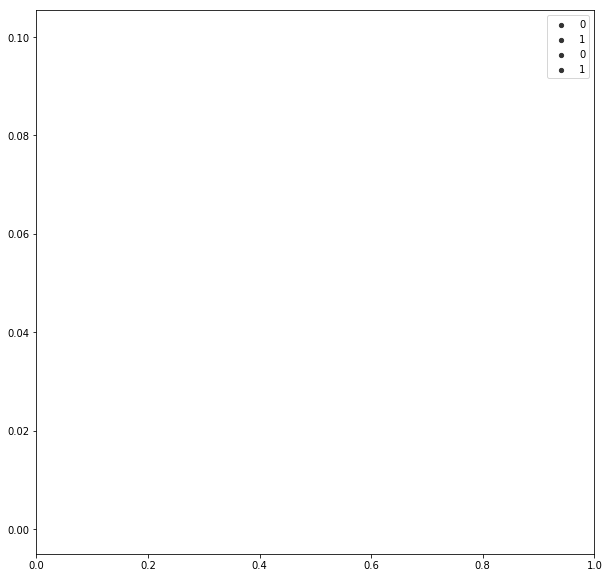

In [46]:
x1, x2 = s.test.y[s.test.bin_hat == 1][:,0], s.test.y[s.test.bin_hat == 0][:,0]

plt.figure(figsize=(10, 10))
axes = plt.gca()
axes.set_xlim([0,1])

sns.scatterplot(x1, np.zeros(x1.size)+.1, size=1)
sns.scatterplot(x2, np.zeros(x2.size), size=1)

plt.show()

# Classical Regression

## Data Extraction

In [47]:
s.validation.bin_hat = opt_model.classifier.predict(s.validation.Xflatten)
mask = s.validation.bin_hat
s_post_valid = SampleSubset(s.validation.bin[mask,:], s.validation.y[mask,:], s.validation.Xscalar[mask,:], s.validation.Xvec[mask,:,:],
                           Xflatten=s.validation.Xflatten[mask,:], Xboundary=s.validation.Xboundary)

mask = s.test.bin_hat
s_post_test = SampleSubset(s.test.bin[mask,:], s.test.y[mask,:], s.test.Xscalar[mask,:], s.test.Xvec[mask,:,:],
                          Xflatten=s.test.Xflatten[mask,:], Xboundary=s.test.Xboundary)

s_post = Sample(None, s_post_valid, s_post_test, scaler=s.scaler)

In [48]:
from classes import Regressor
sel_data = [s_post.validation.Xflatten, s_post.test.Xflatten,
            np.squeeze(s_post.validation.y), np.squeeze(s_post.test.y)]

In [49]:
[x.shape for x in sel_data]

[(3, 154), (1, 154), (3,), ()]

### Y Shift (+ve) for RMSLE

In [50]:
# shift all inputs for 
pos_shift = [-x.min() + 1 + np.finfo(np.float32).eps for x in sel_data[2:]] 
sel_pos_data = sel_data[:2] + [x + shift for x, shift in zip(sel_data[2:], pos_shift)]

## Common Regressors

### KNN

In [51]:
from utils_regressors import KNNReg
knn_reg = Regressor('KNN Regression', KNNReg(sel_pos_data))

ValueError: Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=3.

### Linear Regression

### Support-vector Machine

### Random Forest

In [ ]:
from utils_regressors import RFR
rfr = Regressor('Random Forest', RFR(sel_pos_data))

### Bagging

In [ ]:
from utils_regressors import BagReg
bag_reg = Regressor('Bagging', BagReg(sel_pos_data))

## Performance

### Validation (fit) Error

In [ ]:
models_reg = [knn_reg, rfr, bag_reg]
f = lambda i:models_reg[i].mse
opt_model_reg = models_reg[min(range(len(models_reg)), key=f)]
opt_model_reg.name

In [ ]:
s.validation.y_hat = opt_model_reg.regressor.predict(s.validation.Xflatten) - pos_shift[0]
labels = s.scaler.y.inverse_transform(s.validation.y)
outputs = s.scaler.y.inverse_transform(s.validation.y_hat)

In [ ]:
sns.scatterplot(np.squeeze(labels), np.squeeze(outputs), size=3)
plt.xlabel('True precipitation')
plt.ylabel('Predicted precipitation')
plt.show()

### Test Error

In [ ]:
s.test.y_hat = opt_model_reg.regressor.predict(s.test.Xflatten) - pos_shift[1]
labels = s.scaler.y.inverse_transform(s.test.y)
outputs = s.scaler.y.inverse_transform(s.test.y_hat)

In [ ]:
sns.scatterplot(np.squeeze(labels), np.squeeze(outputs), size=3)
plt.xlabel('True precipitation')
plt.ylabel('Predicted precipitation')
plt.show()

# Convolutional Neural Net

In [ ]:
print('1 class ratio after ADASYN= {:.2%}'.format(s_post.validation.class_ratio))
# ideally 100%

## Network Construction

In [ ]:
# Input placeholders
input_conv = Input(shape=s_post.validation.Xvec.shape[1:], name='column_input')
input_scalar = Input(shape=(s_post.validation.Xscalar.shape[1],), name='surface_input')

# Hidden layers
conv_1 = Conv1D(1, kernel_size=8)(input_conv)
bn_1 = BatchNormalization()(conv_1)
pool_1 = MaxPooling1D(pool_size=2)(bn_1)
act_1 = Activation('relu')(pool_1)

conv_2 = Conv1D(1, kernel_size=4)(act_1)
bn_2 = BatchNormalization()(conv_2)
pool_2 = MaxPooling1D(pool_size=2)(bn_2)
act_2 = Activation('relu')(pool_2)

flatten_2 = Flatten()(act_2)

layer = concatenate([flatten_2, input_scalar])
#layer = Dense(4, activation='relu')(layer)

hid_3 = Dense(2,
              activation='relu')(layer)
hid_3 = Dropout(0.1)(hid_3)

output = Dense(1,
               kernel_regularizer=regularizers.l2(0.02),
               name='output')(hid_3)

# 1. Initialize
model_reg = Model(inputs=[input_conv, input_scalar], outputs=output)
to_file_path = f'nn/model_r_{site.value}.png'
plot_model(model_reg, show_shapes=True, to_file=to_file_path)
print(model_reg.summary())

## Network Training

In [ ]:
# 2. Compile
model_reg.compile(optimizer=Adam(),
                  loss='mean_squared_logarithmic_error')

to_file_path = f'nn/best_model_r_{site.value}.h5'
callbacks = [EarlyStopping(monitor='loss',
                           min_delta=0,
                           patience=40,
                           verbose=0, mode='auto'),
             ModelCheckpoint(filepath=to_file_path, 
                             monitor='loss', 
                             save_best_only=True)]

In [ ]:
# 3. Train
model_reg.fit([s_post.validation.Xvec, s_post.validation.Xscalar], s_post.validation.y,
          epochs=2000,
          callbacks=callbacks,
          verbose=2,
          batch_size=32, 
          validation_data=([s_post.test.Xvec, s_post.test.Xscalar], s_post.test.y)
         )

## Testing

### Validation Error

In [ ]:
s_post.validation.y_hat = model_reg.predict([s_post.validation.Xvec, s_post.validation.Xscalar])
labels = s.scaler.y.inverse_transform(s_post.validation.y)
outputs = s.scaler.y.inverse_transform(s_post.validation.y_hat)

In [ ]:
sns.scatterplot(np.squeeze(labels), np.squeeze(outputs), size=3)
plt.xlabel('True precipitation')
plt.ylabel('Predicted precipitation')
plt.show()

### Test Error

In [ ]:
s_post.test.y_hat = model_reg.predict([s_post.test.Xvec, s_post.test.Xscalar])
labels = s.scaler.y.inverse_transform(s_post.test.y)
outputs = s.scaler.y.inverse_transform(s_post.test.y_hat)

In [ ]:
sns.scatterplot(np.squeeze(labels), np.squeeze(outputs), size=3)
plt.xlabel('True precipitation')
plt.ylabel('Predicted precipitation')
plt.show()